In [138]:
import pandas as pd

In [139]:
covid_data = pd.read_csv('data/covid_data.csv')
covid_data.head()

,date,province/state,country,confirmed,deaths,recovered
0,01/22/2020,Anhui,China,1.0,0.0,0.0
1,01/22/2020,Beijing,China,14.0,0.0,0.0
2,01/22/2020,Chongqing,China,6.0,0.0,0.0
3,01/22/2020,Fujian,China,1.0,0.0,0.0
4,01/22/2020,Gansu,China,0.0,0.0,0.0


In [140]:
vaccinations_data = pd.read_csv('data/country_vaccinations.csv')
vaccinations_data = vaccinations_data[
    ['country', 'date', 'total_vaccinations', 
     'people_vaccinated', 'people_vaccinated_per_hundred',
     'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred',
     'daily_vaccinations', 'vaccines']
]
vaccinations_data.head()

,country,date,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines
0,Afghanistan,2021-02-22,0.0,0.0,0.0,NaN,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
1,Afghanistan,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
2,Afghanistan,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
3,Afghanistan,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
4,Afghanistan,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."


# ПРЕДОБРАБОТКА ДАННЫХ

In [141]:
covid_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306429 entries, 0 to 306428
Data columns (total 6 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   date            306429 non-null  object 
 1   province/state  228329 non-null  object 
 2   country         306429 non-null  object 
 3   confirmed       306429 non-null  float64
 4   deaths          306429 non-null  float64
 5   recovered       306429 non-null  float64
dtypes: float64(3), object(3)
memory usage: 14.0+ MB


In [142]:
covid_data.head()

,date,province/state,country,confirmed,deaths,recovered
0,01/22/2020,Anhui,China,1.0,0.0,0.0
1,01/22/2020,Beijing,China,14.0,0.0,0.0
2,01/22/2020,Chongqing,China,6.0,0.0,0.0
3,01/22/2020,Fujian,China,1.0,0.0,0.0
4,01/22/2020,Gansu,China,0.0,0.0,0.0


In [143]:
covid_data = covid_data.groupby(
    ['date', 'country'],
    as_index=False
)[['confirmed', 'deaths', 'recovered']].sum()

In [144]:
covid_data['date'] = pd.to_datetime(covid_data['date'])

In [145]:
covid_data.head()

,date,country,confirmed,deaths,recovered
0,2021-01-01,Afghanistan,51526.0,2191.0,41727.0
1,2021-01-01,Albania,58316.0,1181.0,33634.0
2,2021-01-01,Algeria,99897.0,2762.0,67395.0
3,2021-01-01,Andorra,8117.0,84.0,7463.0
4,2021-01-01,Angola,17568.0,405.0,11146.0


In [146]:
covid_data['active'] = covid_data['confirmed']\
    - covid_data['deaths']\
    - covid_data['recovered']

In [147]:
covid_data.head()

,date,country,confirmed,deaths,recovered,active
0,2021-01-01,Afghanistan,51526.0,2191.0,41727.0,7608.0
1,2021-01-01,Albania,58316.0,1181.0,33634.0,23501.0
2,2021-01-01,Algeria,99897.0,2762.0,67395.0,29740.0
3,2021-01-01,Andorra,8117.0,84.0,7463.0,570.0
4,2021-01-01,Angola,17568.0,405.0,11146.0,6017.0


In [148]:
covid_data = covid_data.sort_values(by=['country', 'date'])
covid_data['daily_confirmed'] = covid_data.groupby('country')['confirmed'].diff()
covid_data['daily_deaths'] = covid_data.groupby('country')['deaths'].diff()
covid_data['daily_recovered'] = covid_data.groupby('country')['recovered'].diff()

In [149]:
covid_data.head()

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered
11337,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN
11570,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
11807,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12051,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0
12299,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [150]:
vaccinations_data['date'] = pd.to_datetime(vaccinations_data['date'])

In [151]:
covid_data['date'].min()

Timestamp('2020-01-22 00:00:00')

In [152]:
vaccinations_data['date'].sort_values()

28893   2020-12-02
28894   2020-12-03
21214   2020-12-04
28895   2020-12-04
21215   2020-12-05
           ...    
29639   2021-09-06
6809    2021-09-06
30024   2021-09-06
36494   2021-09-06
41328   2021-09-06
Name: date, Length: 42795, dtype: datetime64[ns]

In [153]:
covid_df = covid_data.merge(
    vaccinations_data,
    on=['date', 'country'],
    how='left'
)

In [154]:
covid_df['death_rate'] = covid_df['deaths'] / covid_df['confirmed'] * 100
covid_df['recover_rate'] = covid_df['recovered'] / covid_df['confirmed'] * 100

In [155]:
covid_df.groupby(by='country')['recover_rate'].mean()['Russia']


67.06273489477655

# Графические возможности библиотеки Pandas

## БАЗОВАЯ ВИЗУАЛИЗАЦИЯ В PANDAS

> Основным методом для создания простейших графиков в Pandas является `plot()`.
* `x` — название признака, который будет отложен по оси абсцисс;
* `y` — название признака, который будет отложен по оси ординат;
* `figsize` — размер графика (кортеж из ширины и высоты в дюймах);
* `kind` —тип визуализации. Основные типы:
    * `'line'` — линейный график (по умолчанию);
    * `'bar'` — столбчатая диаграмма;
    * `'barh'` — горизонтальная столбчатая диаграмма;
    * `'hist'` — гистограмма;
    * `'box'` — коробчатая диаграмма (`boxplot`);
    * `'pie'` — круговая диаграмма;
    * `'scatter'` — диаграмма рассеяния.
* `grid` — отображение сетки (по умолчанию `False`);
* `legend` — отображение легенды (по умолчанию `False`);
* `title` — название графика;
* `color` — цвет.

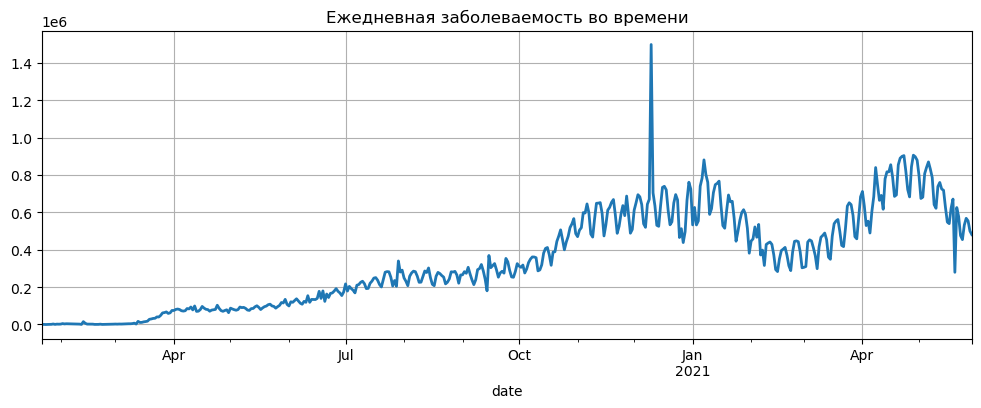

In [156]:
grouped_cases = covid_df.groupby('date')['daily_confirmed'].sum()
grouped_cases.plot(
    kind='line',
    figsize=(12, 4),
    title='Ежедневная заболеваемость во времени',
    grid=True,
    lw=2
);

Здесь и далее в модуле точка с запятой в последней строке кода используется во избежание вывода на экран служебной информации в ноутбуке (попробуйте её убрать и посмотрите, что будет).

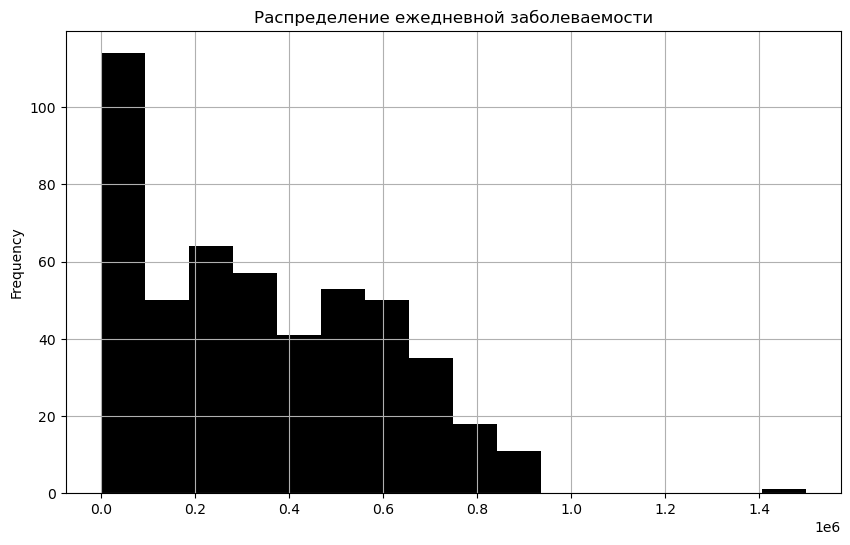

In [157]:
grouped_cases.plot(
    kind='hist',
    figsize=(10, 6),
    title='Распределение ежедневной заболеваемости',
    grid=True,
    color='black',
    bins=16
);

> Для этого сгруппируем данные по странам и вычислим последний зафиксированный показатель с помощью агрегирующего метода `last()` — он возвращает последнее значение в столбце DataFrame.

In [158]:
grouped_country = covid_df.groupby(['country'])['confirmed'].last()
grouped_country = grouped_country.nlargest(10)
grouped_country

country
United States     33251939.0
India             27894800.0
Brazil            16471600.0
France             5719877.0
Turkey             5235978.0
Russia             4995613.0
United Kingdom     4496823.0
Italy              4213055.0
Argentina          3732263.0
Germany            3684672.0
Name: confirmed, dtype: float64

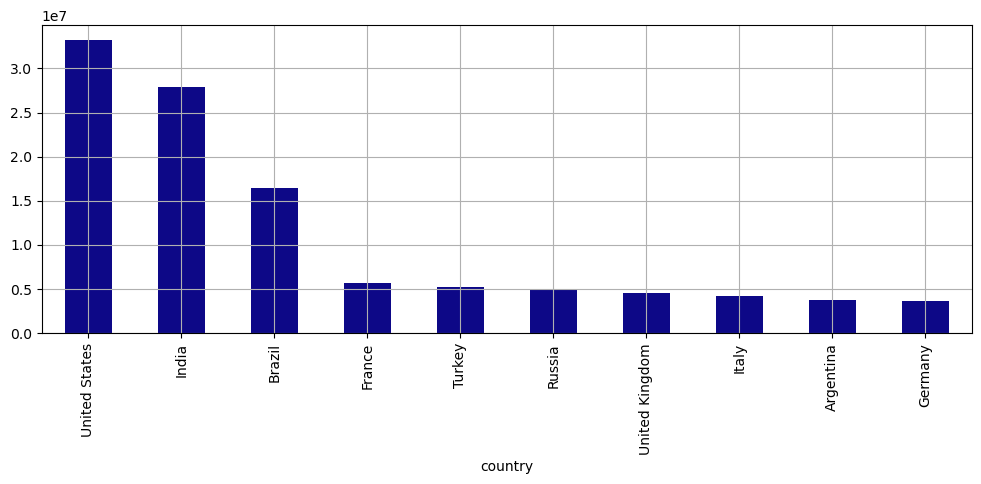

In [159]:
grouped_country.plot(
    kind='bar',
    grid=True,
    figsize=(12, 4),
    colormap='plasma'
);

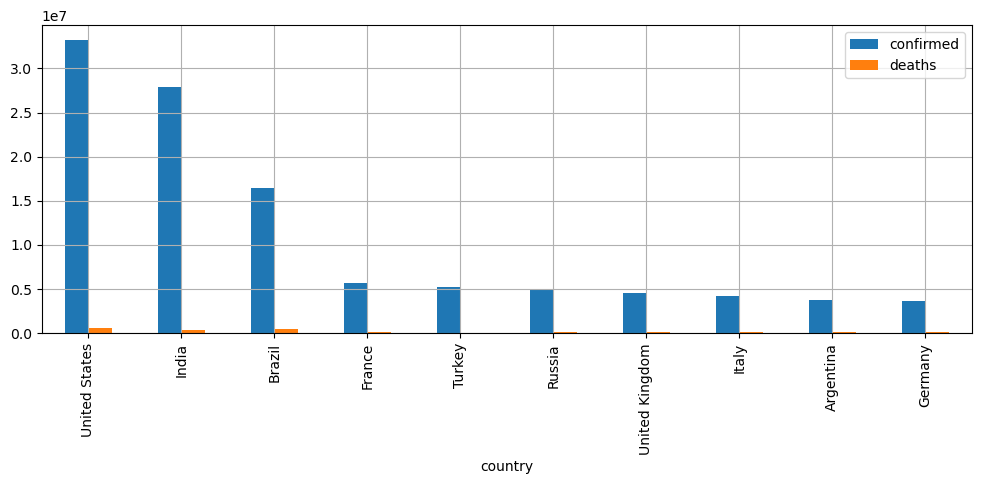

In [160]:
grouped_country = covid_df.groupby(['country'])[['confirmed', 'deaths']].last()
grouped_country = grouped_country.nlargest(10, columns=['confirmed'])
grouped_country.plot(
    kind='bar',
    grid=True,
    figsize=(12, 4),
);

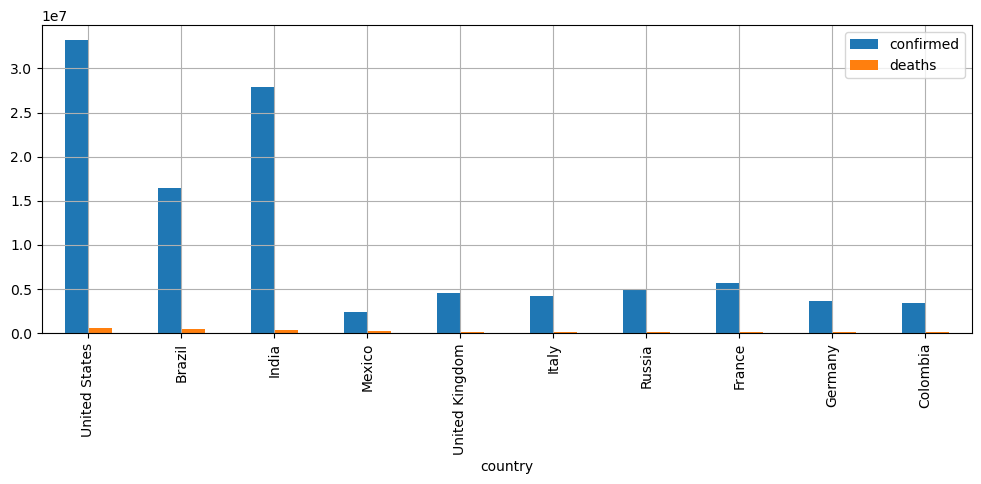

In [161]:
grouped_country = covid_df.groupby('country')[['confirmed', 'deaths']].last()
grouped_country = grouped_country.nlargest(10, columns=['deaths'])
grouped_country.plot(
    kind='bar',
    grid=True,
    figsize=(12, 4)
);

* С помощью Pandas можно построить лишь базовый набор диаграмм. Для построения более сложных видов визуализации Pandas не подходит.
* Трудно настроить визуализацию нескольких видов графиков одновременно в разных масштабах.
* Сложно (иногда и вовсе невозможно) корректировать внешний вид графика.
* Отсутствует 3D-визуализация.

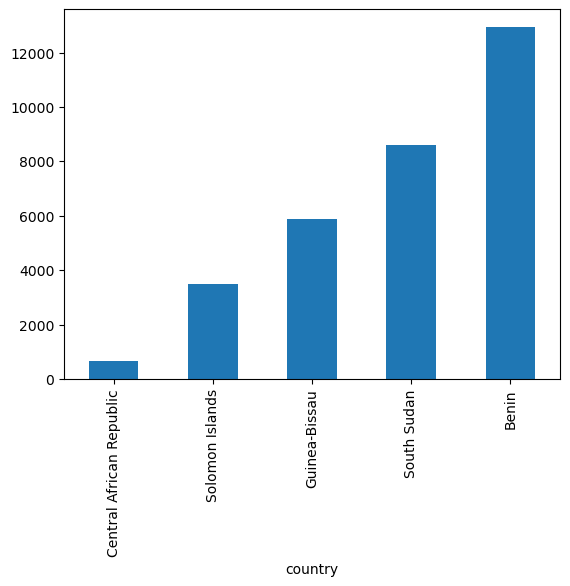

In [162]:
covid_df.groupby(['country'])['total_vaccinations']\
    .last()\
    .nsmallest(5)\
    .plot(
        kind='bar'
    );

# Matplotlib

In [163]:
import matplotlib.pyplot as plt
%matplotlib inline

> Примечание. Если вы используете тёмную тему в VS Code, то для корректного отображения графиков на тёмном фоне выполните следующую команду по установке стиля отображения:

In [164]:
plt.style.use('default')

# ОСНОВНЫЕ ОБЪЕКТЫ MATPLOTLIB

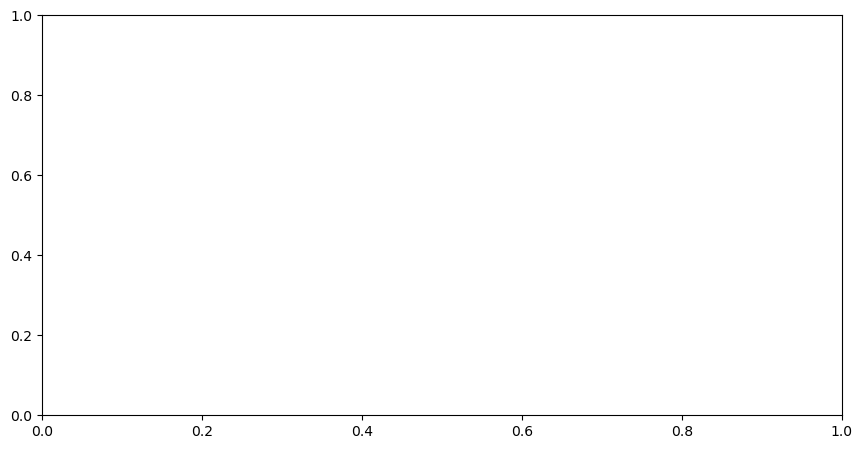

In [165]:
fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])

У объекта координатной плоскости axes вызовем метод scatter().
* x, y — последовательности, которые будут отложены по осям абсцисс и ординат;
* s — размер маркеров;
marker — вид маркеров ('o' — точки, '^' — треугольники);
* c — цвет маркеров.

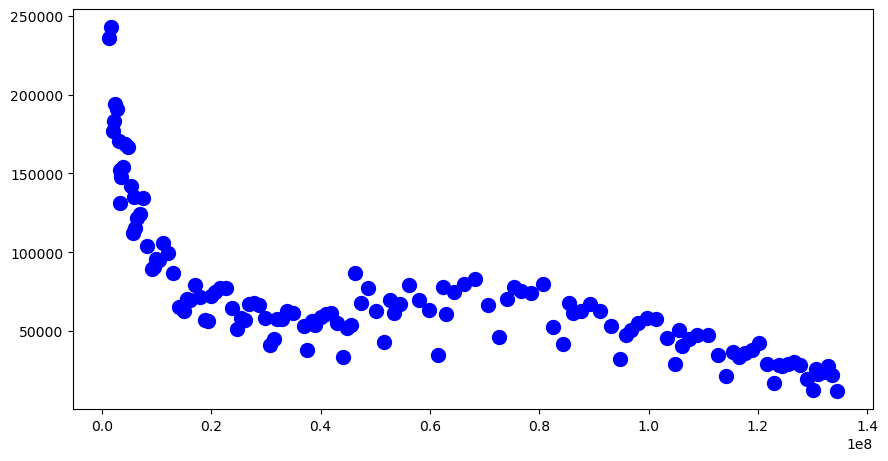

In [166]:
us_data = covid_df[covid_df['country'] == 'United States']

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=us_data['people_fully_vaccinated'], 
    y=us_data['daily_confirmed'], 
    s=100,
    marker='o',
    c = 'blue'
);

Для построения круговых диаграмм в Matplotlib используется метод pie().

* x — значения, по которым будет строиться круговая диаграмма;
* labels — метки, соответствующие значениям;
* autopct — формат отображения долей на диаграмме (например, '%.1f%%' означает, что округление будет производиться до первого знака после запятой и при выводе будет указан знак "%"; открывающий и закрывающий проценты означают форматирование, а внутренний — вывод знака "%");
* explode — последовательность, которая определяет долю смещения сектора от центра для каждого значения из x.

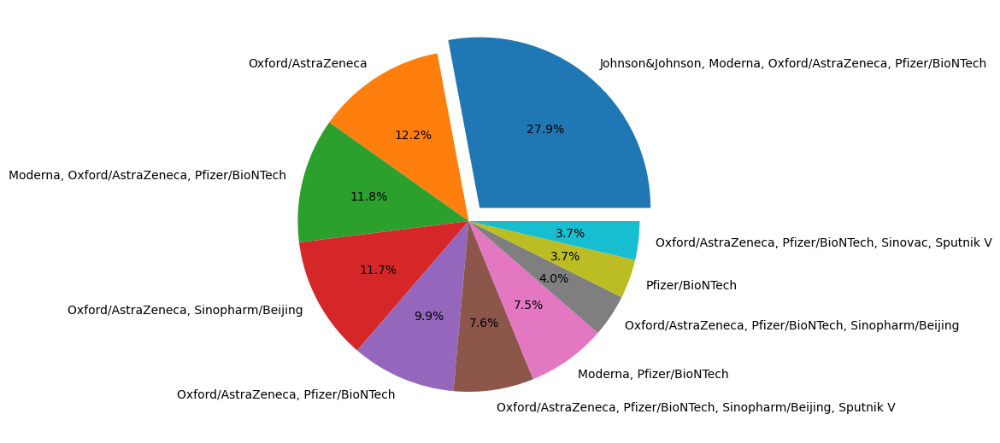

In [167]:
vaccine_combination = covid_df['vaccines'].value_counts()[:10]
fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccine_combination,
    labels=vaccine_combination.index,
    autopct='%.1f%%',
    explode=[0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
);

In [168]:
covid_df.head()

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate
0,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0


In [169]:
combination_not_nan = covid_df.dropna(subset=['vaccines'])

In [170]:
combination_last = combination_not_nan.groupby(['country'])['vaccines'].last()

In [171]:
combination_last = combination_last.apply(lambda x: x.replace(' ', '').split(','))

In [172]:
combination_last.head()

country
Afghanistan    [Johnson&Johnson, Oxford/AstraZeneca, Pfizer/B...
Albania        [Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac,...
Algeria        [Oxford/AstraZeneca, Sinopharm/Beijing, SputnikV]
Andorra                    [Oxford/AstraZeneca, Pfizer/BioNTech]
Angola                                      [Oxford/AstraZeneca]
Name: vaccines, dtype: object

In [173]:
combination_last[1][1]

'Pfizer/BioNTech'

In [174]:
vaccines_dict = {}

for vaccines_list in combination_last:
    for vaccine in vaccines_list:
        if vaccine not in vaccines_dict:
            vaccines_dict[vaccine] = 1
        else:
            vaccines_dict[vaccine] += 1

In [175]:
vaccines = pd.Series(vaccines_dict).sort_values(ascending=False)
vaccines['other'] = vaccines[7:].sum()
vaccines = vaccines.sort_values(ascending=False)[:8]
vaccines

Oxford/AstraZeneca    149
Pfizer/BioNTech       102
Sinopharm/Beijing      66
Moderna                58
SputnikV               48
Johnson&Johnson        45
Sinovac                39
other                  24
dtype: int64

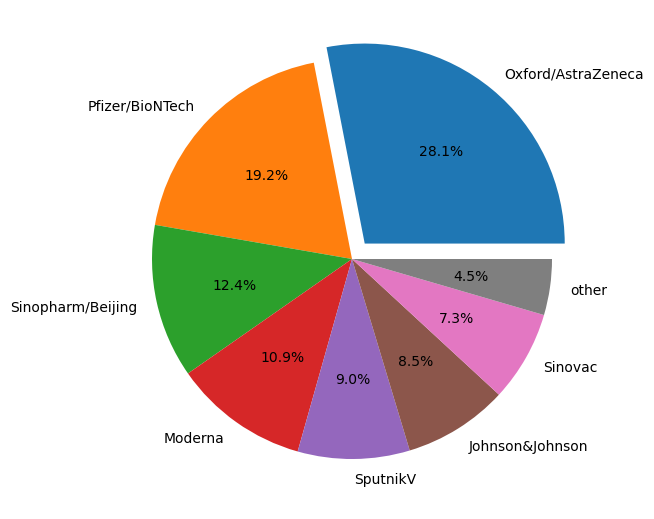

In [176]:
fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccines,
    labels=vaccines.index,
    autopct='%.1f%%',
    explode=[0.1, 0, 0, 0, 0, 0, 0, 0]
);

# ДОБАВЛЕНИЕ ИНФОРМАТИВНОСТИ В ГРАФИКИ

* `axes.set_title()` — заголовок диаграммы, а также его настройки (например, параметр fontsize отвечает за размер шрифта);
* `axes.set_xlabel()` — название оси абсцисс;
* `axes.set_ylabel()` — название оси ординат;
* `axes.set_xticks()` — установка отметок на оси абсцисс;
* `axes.set_yticks()` — установка отметок на оси ординат;
* `axes.xaxis.set_tick_params()` — управление параметрами отметок на оси абсцисс (например, параметр rotation отвечает за поворот отметок в градусах);
* `axes.yaxis.set_tick_params()` — управление параметрами отметок на оси ординат;
* `axes.legend()` — отображение легенды;
* `axes.grid()` — установка сетки.

In [177]:
china_data = covid_df[covid_df['country'] == 'China']
china_grouped = china_data.groupby(['date'])[['confirmed', 'active', 'deaths', 'recovered']].sum()

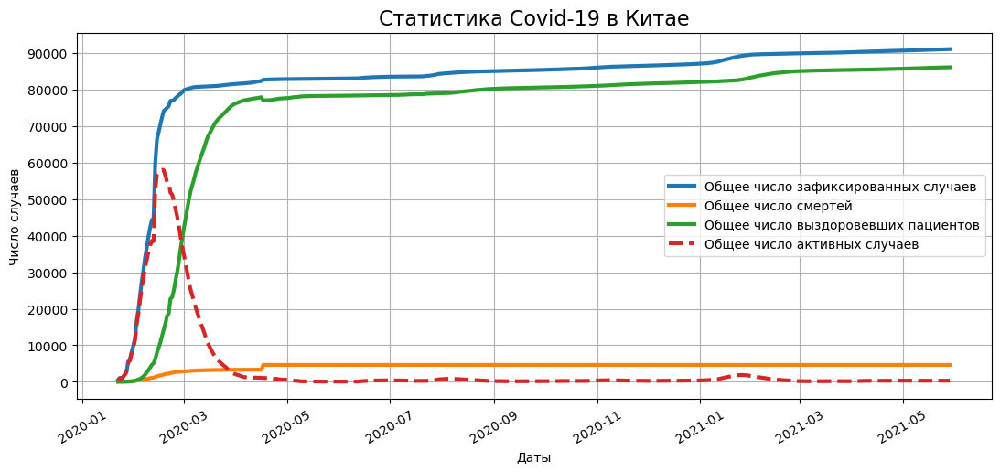

In [178]:
fig = plt.figure(figsize=(10, 4))
axes = fig.add_axes([0, 0, 1, 1])

axes.plot(
    china_grouped['confirmed'],
    label='Общее число зафиксированных случаев',
    lw=3
)
axes.plot(
    china_grouped['deaths'],
    label='Общее число смертей',
    lw=3
)
axes.plot(
    china_grouped['recovered'],
    label='Общее число выздоровевших пациентов',
    lw=3
)
axes.plot(
    china_grouped['active'],
    label='Общее число активных случаев',
    lw=3,
    linestyle='dashed'
)

axes.set_title('Статистика Covid-19 в Китае', fontsize=16)
axes.set_xlabel('Даты')
axes.set_ylabel('Число случаев')
axes.set_yticks(range(0, 100000, 10000))
axes.xaxis.set_tick_params(rotation=30)
axes.grid()
axes.legend();

# ИСПОЛЬЗОВАНИЕ НЕСКОЛЬКИХ СИСТЕМ КООРДИНАТ

> Для добавления второй системы координат необходимо повторно применить к объекту fig метод add_axes, указав новое имя для второй системы координат.

Основные параметры метода `bar()`  
* `x` — названия категорий, которые будут располагаться по оси абсцисс;
* `height` — высота столбцов диаграммы, массив из показателей для визуализации (например, среднее, максимальное значение и т. д.);
* `width` — ширина столбцов диаграммы;
* `color` — цвет.

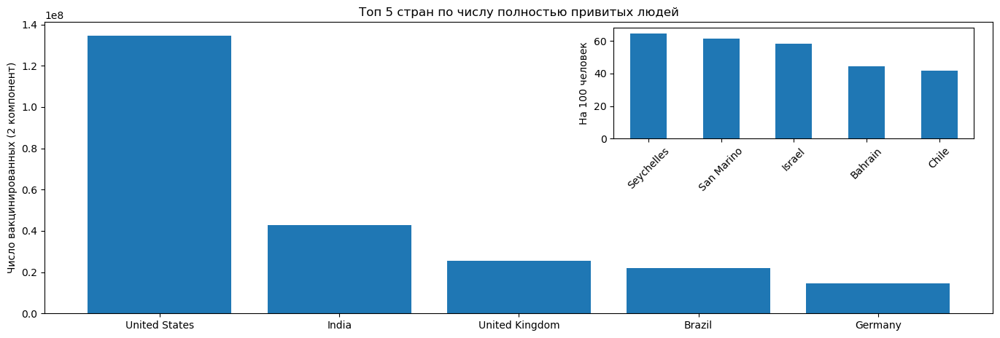

In [179]:
vacc_country = covid_df\
    .groupby('country')['people_fully_vaccinated']\
    .last().nlargest(5)

vacc_country_per_hundred = covid_df\
    .groupby('country')['people_fully_vaccinated_per_hundred']\
    .last().nlargest(5)
    
fig = plt.figure(figsize=(13, 4))
main_axes = fig.add_axes([0, 0, 1, 1])
main_axes.bar(x = vacc_country.index, height = vacc_country);
main_axes.set_ylabel('Число вакцинированных (2 компонент)')
main_axes.set_title('Топ 5 стран по числу полностью привитых людей')

insert_axes = fig.add_axes([0.6, 0.6, 0.38, 0.38])
insert_axes.bar(
    x = vacc_country_per_hundred.index,\
    height = vacc_country_per_hundred,\
    width=0.5
    )
insert_axes.set_ylabel('На 100 человек')
insert_axes.xaxis.set_tick_params(rotation=45)

# SUBPLOTS

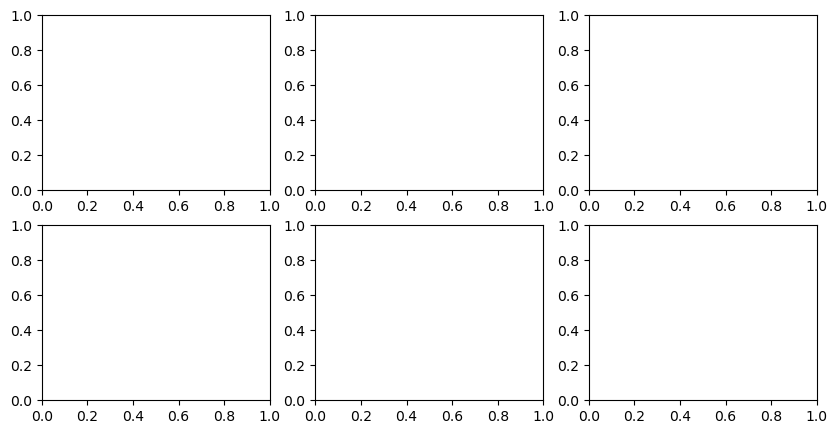

In [180]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 5))

За построение гистограмм в библиотеке Matplotlib отвечает метод hist(). 
* x — массив чисел, для которого строится гистограмма;
* bins — число столбцов (корзин);
* orientation — ориентация гистограммы (по умолчанию 'vertical');
* color — цвет. 

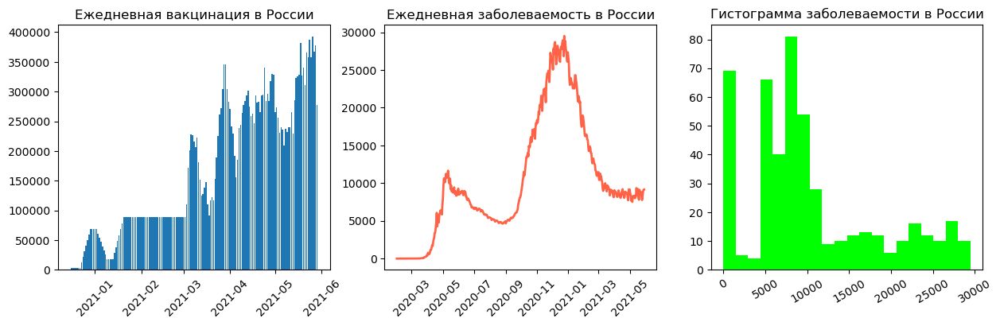

In [181]:
russia_df = covid_df[covid_df['country'] == 'Russia']
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

# столбчатая диаграмма
axes[0].bar(
    x=russia_df['date'],
    height=russia_df['daily_vaccinations'],
    label='Число вакцинированных'
)
axes[0].set_title('Ежедневная вакцинация в России')
axes[0].xaxis.set_tick_params(rotation=45);

# линейный график
axes[1].plot(
    russia_df['date'],
    russia_df['daily_confirmed'],
    label='Число заболевших',
    color='tomato',
    lw=2
)
axes[1].set_title('Ежедневная заболеваемость в России')
axes[1].xaxis.set_tick_params(rotation=45)

# гистограмма
axes[2].hist(
    x=russia_df['daily_confirmed'],
    label=['Число заболевших'],
    color='lime',
    bins=20
)
axes[2].set_title('Гистограмма заболеваемости в России')
axes[2].xaxis.set_tick_params(rotation=30);

Также стоит отметить, что, помимо объектно-ориентированного подхода в работе с библиотекой Matplotlib, вы можете встретить и модульный подход.

Модульный подход основан на обращении к модулю pyplot (plt) напрямую, а не средствами объектов фигур и плоскостей. Например, следующий код строит столбчатую диаграмму: по оси x откладываются элементы списка names (названия групп), а высоту столбцов определяет список values.

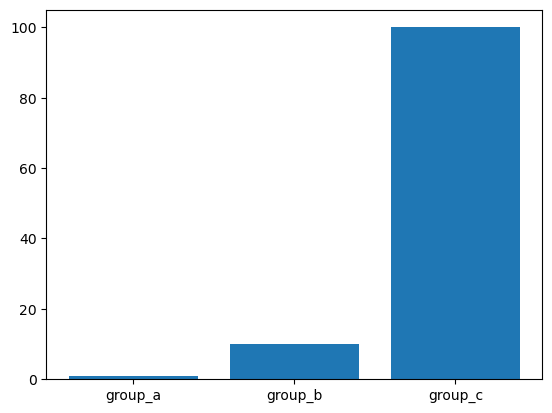

In [182]:
names = ['group_a', 'group_b', 'group_c']
values = [1, 10, 100]
plt.bar(names, values)
plt.show()

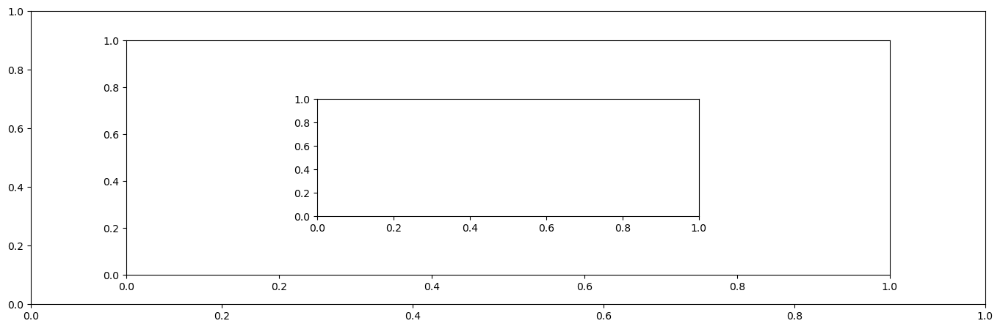

In [183]:
fig = plt.figure(figsize=(13, 4))
main_axes = fig.add_axes([0, 0, 1, 1])
insert_axes = fig.add_axes([0.1, 0.1, 0.8, 0.8])
insert_axes2 = fig.add_axes([0.3, 0.3, 0.4, 0.4])

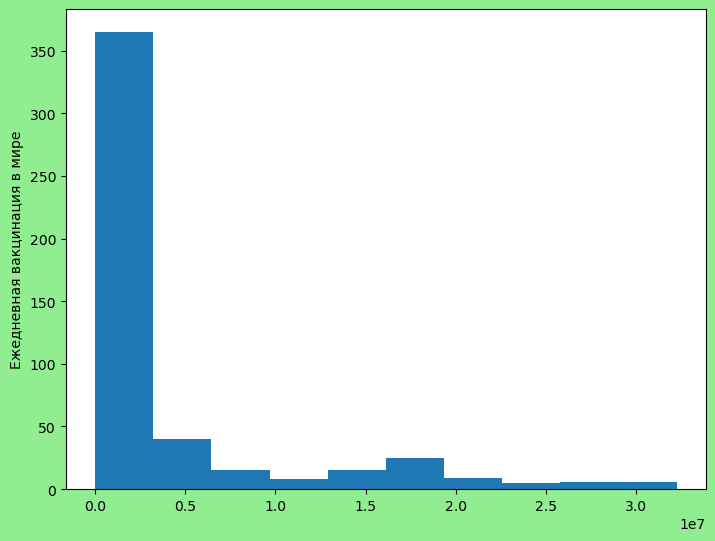

In [184]:
fig = plt.figure(facecolor='lightgreen')
axes = fig.add_axes([0, 0, 1, 1])
axes.hist(covid_df.groupby('date')['daily_vaccinations'].sum())
axes.set_ylabel('Ежедневная вакцинация в мире');

# Графические возможности библиотеки Seaborn

In [185]:
import seaborn as sns
print(sns.__version__)

0.11.2


In [186]:
countries = ['Russia', 'Australia', 'Germany', 'Canada', 'United Kingdom']
croped_covid_df = covid_df[covid_df['country'].isin(countries)]

populations = pd.DataFrame([
    ['Canada', 37664517],
    ['Germany', 83721496],
    ['Russia', 145975300],
    ['Australia', 25726900],
    ['United Kingdom', 67802690]
    ],
    columns=['country', 'population']
)
croped_covid_df = croped_covid_df.merge(populations, on=['country'])
croped_covid_df['daily_confirmed_per_hundred'] = croped_covid_df['daily_confirmed'] / croped_covid_df['population'] * 100
croped_covid_df.head()

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recover_rate,population,daily_confirmed_per_hundred
0,2020-01-23,Australia,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25726900,NaN
1,2020-01-25,Australia,4.0,0.0,0.0,4.0,4.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000016
2,2020-01-26,Australia,4.0,0.0,0.0,4.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000
3,2020-01-27,Australia,5.0,0.0,0.0,5.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000004
4,2020-01-28,Australia,5.0,0.0,0.0,5.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,25726900,0.000000


Начнём с гистограммы. Для визуализации гистограмм в библиотеке Seaborn используется метод `histplot()`.

* `data` — DataFrame, по которому строится график;
* `x` — признак, который будет отложен по оси абсцисс;
* `y` — признак, который будет отложен по оси ординат;
* `hue` — группировочный категориальный признак, который позволяет строить отдельный график для каждой категории (не стоит использовать его для гистограмм, но он широко используется для других видов графиков в Seaborn);
* `ax` — система координат `Matplotlib`, в которой строится график;
* `color` — цвет графика;
* `bins` — число столбцов в гистограмме (по умолчанию вычисляется автоматически с помощью специальных формул);
* `kde` — параметр, указывающий, стоит ли сглаживать гистограмму кривой (по умолчанию `False`).

Построим сразу две гистограммы: одна будет иллюстрировать общее распределение ежедневной заболеваемости `(daily_confirmed)`, а вторая — то же распределение в разрезе стран. 

Для этого создаём две координатные плоскости с помощью метода `subplots()`. 

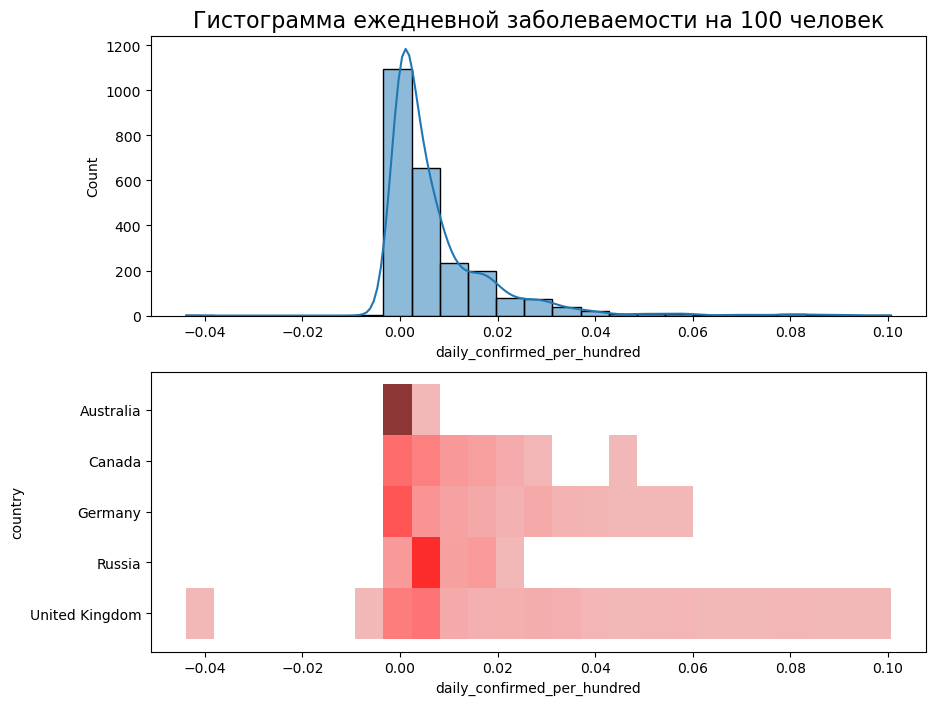

In [187]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))
sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    bins=25,
    kde=True,
    ax=axes[0]
);
axes[0].set_title('Гистограмма ежедневной заболеваемости на 100 человек', fontsize=16)

sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    y='country',
    bins=25,
    color='red',
    ax=axes[1]
);

Ящики отразим горизонтально (для этого по оси x отложим признак летальности, а по оси y — страны), параметр orient отвечает за ориентацию диаграммы, а width — за ширину коробок:

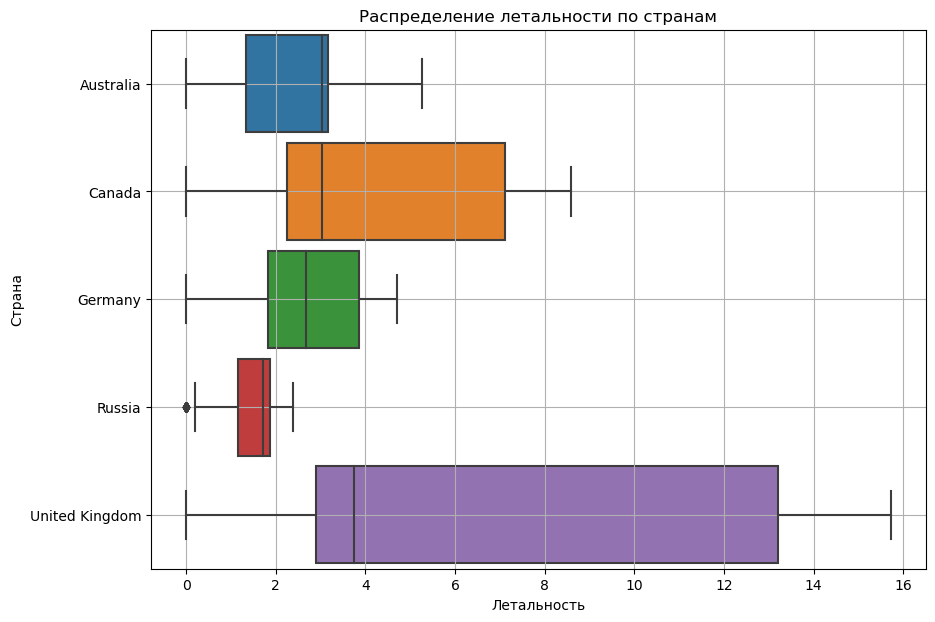

In [188]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='death_rate',
    orient='h',
    width=0.9
)
boxplot.set_title('Распределение летальности по странам')
boxplot.set_xlabel('Летальность')
boxplot.set_ylabel('Страна')
boxplot.grid()

In [189]:
croped_covid_df[['country', 'death_rate']]

,country,death_rate
0,Australia,NaN
1,Australia,0.000000
2,Australia,0.000000
3,Australia,0.000000
4,Australia,0.000000
...,...,...
2435,United Kingdom,2.855140
2436,United Kingdom,2.853437
2437,United Kingdom,2.851509
2438,United Kingdom,2.849175


Для построения столбчатых диаграмм в `Seaborn` используется метод `barplot()`. По умолчанию метод отображает среднее по столбцу, который указан в параметре `x` (вместо среднего можно вычислить и любую другую статистическую характеристику, наименование которой задаётся в параметре `estimator`). Для добавления многоуровневости используется параметр `hue`, который позволяет группировать данные по признаку:

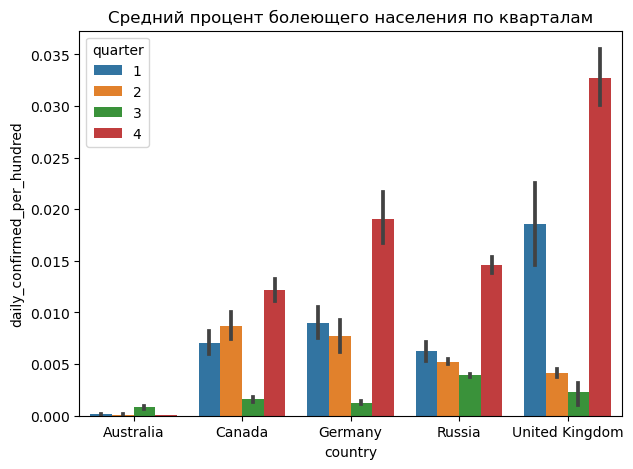

In [190]:
fig = plt.figure(figsize=(7, 5))
croped_covid_df['quarter'] = croped_covid_df['date'].dt.quarter
barplot = sns.barplot(
    data=croped_covid_df,
    x='country',
    y='daily_confirmed_per_hundred',
    hue='quarter',
    
)
barplot.set_title('Средний процент болеющего населения по кварталам');

Построим один из самых любимых дата-сайентистами графиков — `jointplot()` — в котором совмещены диаграмма рассеяния и гистограмма. Это довольно удобный и полезный инструмент, когда мы хотим одновременно посмотреть и на распределения переменных, и сразу оценить их взаимосвязь.

Параметры xlim и ylim определяют диапазон отображения осей x и y. Параметр height отвечает за высоту и ширину графика (он квадратный).

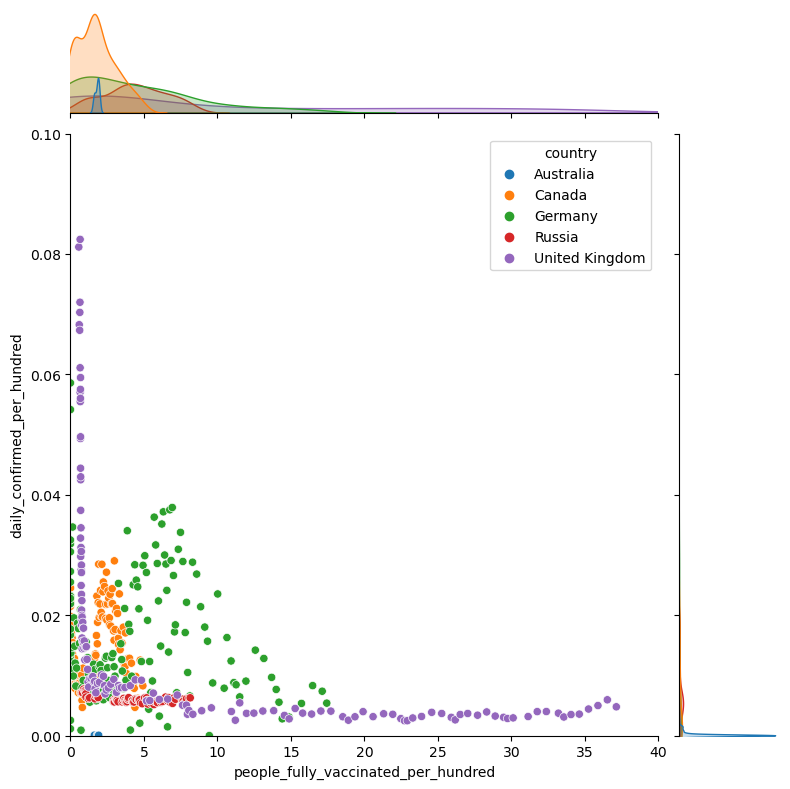

In [191]:
jointplot = sns.jointplot(
    data=croped_covid_df, 
    x='people_fully_vaccinated_per_hundred', 
    y='daily_confirmed_per_hundred',
    hue='country',
    xlim = (0, 40),
    ylim = (0, 0.1),
    height=8,
)

In [192]:
pivot = croped_covid_df.pivot_table(
    values='people_vaccinated_per_hundred',
    columns='date',
    index='country',
)
pivot.columns = pivot.columns.astype('string')
pivot

date,2020-12-13,2020-12-14,2020-12-15,2020-12-16,2020-12-17,2020-12-18,2020-12-19,2020-12-20,2020-12-21,2020-12-22,...,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29
country,,,,,,,,,,,,,,,,,,,,,
Australia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,12.40,12.69,12.88,13.28,13.73,14.18
Canada,NaN,0.0,0.00,0.01,0.02,0.03,0.03,0.03,0.05,0.07,...,48.10,49.25,50.14,50.89,51.77,52.39,53.05,53.95,54.99,55.71
Germany,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.18,39.68,39.95,40.11,40.29,40.64,41.29,41.87,42.40,42.61
Russia,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN,0.04,...,10.20,10.30,10.50,10.53,10.70,10.81,11.07,11.12,11.19,11.29
United Kingdom,0.13,NaN,NaN,NaN,NaN,NaN,NaN,0.99,NaN,NaN,...,55.01,55.33,55.63,55.82,55.99,56.27,56.61,56.99,57.29,57.56


Для построения тепловой карты в `Seaborn` используется метод `heatmap()`. Данный метод работает с табличными данными и визуализирует все ячейки таблицы с помощью цвета. Параметр `annot` отвечает за отображение легенды (аннотации), параметр `cmap` — за цветовую гамму графика.

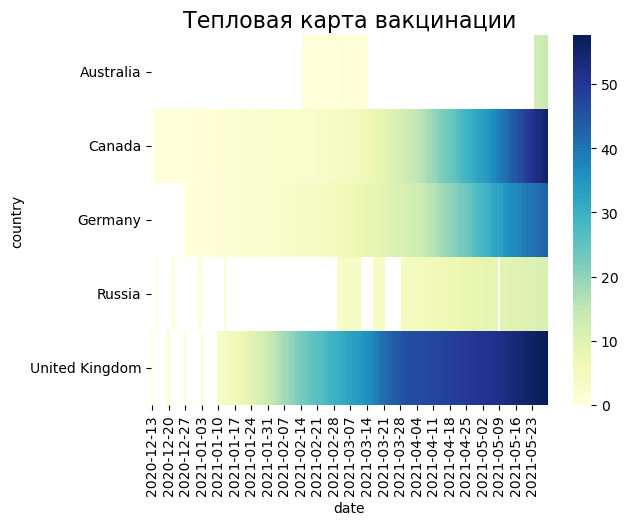

In [193]:
heatmap = sns.heatmap(data=pivot, cmap='YlGnBu')
heatmap.set_title('Тепловая карта вакцинации', fontsize=16);

In [194]:
croped_covid_df['confirmed_per_hundred'] = croped_covid_df['confirmed'] / croped_covid_df['population'] * 100

In [195]:
confirmed_proportion = croped_covid_df.pivot(
    values='confirmed_per_hundred',
    columns='date',
    index='country'
)
confirmed_proportion.columns = confirmed_proportion.columns.astype('string')
confirmed_proportion

date,2020-01-23,2020-01-25,2020-01-26,2020-01-27,2020-01-28,2020-01-29,2020-01-30,2020-01-31,2020-02-01,2020-02-02,...,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29
country,,,,,,,,,,,,,,,,,,,,,
Australia,0.0,0.000016,0.000016,0.000019,0.000019,0.000019,0.000035,0.000035,0.000047,0.000047,...,0.116606,0.116621,0.116637,0.116683,0.116722,0.116788,0.116854,0.116897,0.116932,0.116983
Canada,NaN,NaN,0.000003,0.000003,0.000005,0.000005,0.000008,0.000008,0.000011,0.000011,...,3.599497,3.611526,3.620169,3.628017,3.632706,3.642529,3.648718,3.661252,3.669520,3.675536
Germany,NaN,NaN,NaN,NaN,0.000005,0.000005,0.000005,0.000006,0.000010,0.000012,...,4.345962,4.355632,4.363299,4.368845,4.371625,4.374704,4.380047,4.388347,4.395716,4.401106
Russia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000001,0.000001,0.000001,...,3.368999,3.375035,3.380916,3.386963,3.392637,3.397954,3.403604,3.409708,3.415960,3.422232
United Kingdom,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000003,0.000003,0.000003,...,6.594230,6.598223,6.601946,6.605033,6.608528,6.612093,6.616504,6.621495,6.627439,6.632219


Text(0.5, 1.0, 'Тепловая карта процента заболевших')

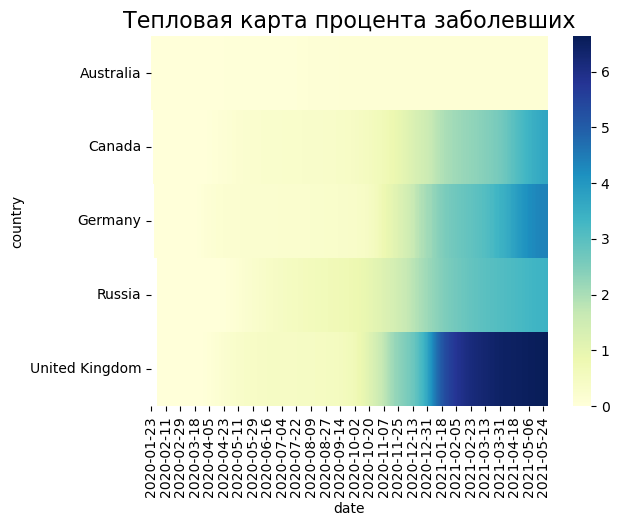

In [196]:
heatmap = sns.heatmap(
    data=confirmed_proportion,
    cmap='YlGnBu'
)
heatmap.set_title('Тепловая карта процента заболевших', fontsize=16)

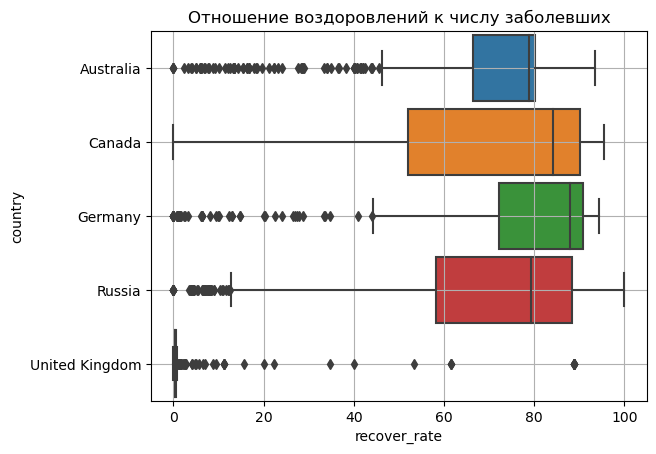

In [197]:
boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='recover_rate',
    orient='h',
    width=0.9
)
boxplot.set_title('Отношение воздоровлений к числу заболевших')
boxplot.grid()

# Plotly

> Сейчас, с появлением новых оптимизированных модулей и надстроек в Plotly (express и cufflinks), которые позволили упростить работу с библиотекой, в отрасли наблюдается тенденция постепенного перехода бизнеса к использованию Plotly при работе с данными, ведь бесплатную версию библиотеки разрешено применять в коммерческих продуктах.

In [198]:
import plotly
import plotly.express as px
print(plotly.__version__)

5.8.0


Примечание. Для того чтобы графики Plotly отображались в VS Code, необходимо установить расширение Jupyter Notebook Renderers.

С помощью экспресс-режима (px) можно строить уже знакомые нам графики:

* `line()` — линейные графики;
* `histogram()` — гистограммы;
* `scatter()` — диаграммы рассеяния;
* `box()` — коробчатые диаграммы;
* `bar()` — столбчатые диаграммы;
* `pie()` — круговые диаграммы.

Основные параметры метода line()
* `data_frame` — DataFrame, по которому строится график;
* `x` — признак по оси абсцисс;
* `y` — признак по оси ординат;
* `height` — высота графика;
* `width` — ширина графика;
* `title` — название графика.

In [199]:
line_data = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_data, #DataFrame
    x='date', #ось абсцисс
    y=['confirmed', 'recovered', 'deaths', 'active'], #ось ординат
    height=500, #высота
    width=1000, #ширина
    title='Confirmed, Recovered, Deaths, Active cases over Time' #заголовок
)
fig.show()

Для этого используем метод bar() модуля express. Добавим несколько параметров:

* `color` — группирующий признак, в соответствии с которым будут раскрашены столбцы диаграммы;
* `text` — текст, который будет подписан на столбцах диаграммы;
* `orientation` — ориентация графика ('v' — вертикальная, 'h' — горизонтальная).

In [200]:
bar_data = covid_df.groupby(
    by='country',
    as_index=False
)[['recover_rate']].mean().round(2).nlargest(10, columns=['recover_rate'])

fig = px.bar(
    data_frame=bar_data,
    x='country',
    y='recover_rate',
    color='country',
    text='recover_rate',
    orientation='v',
    height=500,
    width=1000,
    title='Top 10 countries for Recovery Rate'
)

fig.show()

А теперь давайте построим что-нибудь, специфичное для библиотеки Plotly. Например, график `treemap()` (древесная, или иерархическая, диаграмма). Такой график используется для исследования показателя, когда число возможных категорий велико (например, число стран в таблице covid_df).

→ Данный вид диаграммы схож с круговой диаграммой и столбчатой диаграммой, однако, в отличие от них, позволяет вместить информацию о гораздо большем числе категорий, не потеряв при этом информативность.

Основные параметры метода `treemap()`  
* `data_frame` — `DataFrame`, по которому строится график;
* `path` — категориальные признаки (их может быть несколько), в разрезе которых строится диаграмма;
* `values` — показатель, по которому рассчитываются размеры прямоугольников.

In [201]:
treemap_data = covid_df.groupby(
    by='country',
    as_index=False
)[['daily_recovered']].mean()

#строим график
fig = px.treemap(
    data_frame=treemap_data, #DataFrame
    path=['country'], #категориальный признак, для которого строится график
    values='daily_recovered', #параметр, который сравнивается
    height=1000, #высота
    width=1000, #ширина
    title='Daily Recovered Cases by Country' #заголовок
)

#отображаем график
fig.show()

# АНИМАЦИЯ ГРАФИКОВ ВО ВРЕМЕНИ

Для нашей задачи отлично подойдёт график под названием choropleth() (тепловая картограмма) — это тепловая карта, которая строится на географической карте мира. Чтобы увидеть, как изменяется значение показателя на карте во времени, можно добавить в график анимацию.

Основные параметры метода `choropleth()`

* `data_fram`e — `DataFrame`, по которому строится график;
* `locations` — название столбца, из которого берутся локации (столбец со странами или регионами);
* `locationmode` — режим геопривязки; определяет, как будет производиться сопоставление данных с картой в `Plotly` (возможно сопоставление по названию страны, "country_name", или по её трёхзначному шифру, согласно международному стандарту ISO-3);
* `range_color` — диапазон изменения цвета;
* `animation_frame` — анимирующий признак, изменяя который, мы получаем визуализацию во времени;
* `color_continuous_scale` — цветовая палитра.

In [202]:
#преобразуем даты в строковый формат
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')

#строим график
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="confirmed", #от чего зависит цвет
    animation_frame="date", #анимационный бегунок
    range_color=[0, 30e6], #диапазон цвета
    title='Global Spread of COVID-19', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем график
fig.show()

# ТРЁХМЕРНАЯ ВИЗУАЛИЗАЦИЯ

На самом деле общий принцип построения 3D-графиков ничем не отличается от построения обычных. Просто добавляется ещё один параметр — ось z (ось аппликат).

Для построения такой диаграммы используем метод scatter_3d(). Добавим несколько параметров:

* `z` — параметр по оси аппликат;
* `log_x` — установка логарифмического масштаба по оси x;
* `log_y` — установка логарифмического масштаба по оси y.
* Чтобы не перегрузить график, будем строить зависимость только в нескольких странах: США, России, Великобритании, Бразилии и Франции. Наблюдения для каждой страны окрасим разными цветами.

In [203]:
countries = ['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
scatter_data = covid_df[covid_df['country'].isin(countries)]

fig = px.scatter_3d(
    data_frame=scatter_data,
    x='daily_confirmed',
    y='daily_deaths',
    z='daily_vaccinations',
    color='country',
    log_x=True,
    log_y=True,
    width=1000,
    height=700
)

fig.show()

In [204]:
fig.write_html("plotly/scatter_3d.html")

In [206]:
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
box_data = covid_df[covid_df['country'].isin(countries)]
fig = px.box(data_frame=box_data, x='people_fully_vaccinated_per_hundred', color='country')
fig.show()

In [210]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 86785 entries, 0 to 86784
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   date                                 86785 non-null  datetime64[ns]
 1   country                              86785 non-null  object        
 2   confirmed                            86785 non-null  float64       
 3   deaths                               86785 non-null  float64       
 4   recovered                            86785 non-null  float64       
 5   active                               86785 non-null  float64       
 6   daily_confirmed                      86564 non-null  float64       
 7   daily_deaths                         86564 non-null  float64       
 8   daily_recovered                      86564 non-null  float64       
 9   total_vaccinations                   10629 non-null  float64       
 10  people_vac

In [213]:
daily_data = covid_df.groupby(by='date', as_index=False)[['daily_vaccinations']].sum()
fig = px.line(
    data_frame=daily_data,
    x='date',
    y='daily_vaccinations',
    height=500,
    width=700,
    title='Daily vaccinations in time'
)

fig.show()

In [222]:
vaccines_data['total_vaccinations'].describe()

count    1.062900e+04
mean     7.506625e+06
std      3.304911e+07
min      0.000000e+00
25%      9.642100e+04
50%      6.229120e+05
75%      2.801356e+06
max      6.209740e+08
Name: total_vaccinations, dtype: float64

In [223]:
vaccines_data = covid_df.sort_values(by='date')
vaccines_data['date'] = vaccines_data['date'].astype('string')

fig = px.choropleth(
    data_frame=vaccines_data,
    locations='country',
    locationmode='country names',
    color='total_vaccinations',
    animation_frame='date',
    range_color=[0, 10e8],
    title='Vaccinations by countries',
    width=800,
    height=500,
    color_continuous_scale='Reds'
)

fig.show()